In [12]:
from aja_pose import Model

import os
import yaml
import sys
import warnings
import os.path as osp

import torch
import torchvision.transforms as transforms
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import ultralytics
from ultralytics import YOLO

warnings.filterwarnings("ignore")
# get the current path
module_dir = os.getcwd()


 # yaml file path
yaml_file = os.path.join(module_dir, 'aja_pose', 'experiments', 'mpii', 'vhrbirdpose', 'w32_256x256_adam_lr1e-3_ak_vhr_s.yaml')
pretrained_model = os.path.join(module_dir, 'aja_pose', 'modelDir', 'all_animals_no_pretrain_106.pth')
yolo_model = os.path.join(module_dir, 'aja_pose', 'modelDir', 'yolo_det_best.pt')

def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)


# this_dir = osp.dirname(__file__)

lib_path = osp.join(module_dir, 'aja_pose', 'lib')
add_path(lib_path)

import models

from aja_pose.lib.config import cfg
from aja_pose.lib.core.inference import *
from aja_pose.lib.utils.transforms import transform_preds

In [271]:
class Args:
    def __init__(self, cfg, opts=[],modelDir='', logDir='', dataDir='', prevModelDir=''):
        self.cfg = cfg
        self.opts = opts
        self.modelDir = modelDir
        self.logDir = logDir
        self.dataDir = dataDir
        self.prevModelDir = prevModelDir


# path to data directory
class PoseInference(Model): # Inherit from the Model class
    # add path to lib directory
    def add_path(self):
        lib_path = osp.join(module_dir, 'lib')
        if lib_path not in sys.path:
            sys.path.insert(0, lib_path)
    
    def load_model(self, pretrained=pretrained_model):
        sys.path.append(os.path.join(module_dir, 'lib'))
        from aja_pose.lib.config import cfg
        from aja_pose.lib.config import update_config

        
        super().write_yaml(yaml_file, pretrained=pretrained)
        
        if torch.cuda.is_available():
            device = torch.device('cuda')
        else:
            device = torch.device('cpu')
        
        args = Args(yaml_file)
        
        update_config(cfg, args)
        
        # load the model
        model = eval('models.'+cfg.MODEL.NAME+'.get_pose_net')(
            cfg, is_train=False
        )

        # load the model weights
        model.load_state_dict(torch.load(cfg.TEST.MODEL_FILE, map_location=device), strict=False)
        model.eval()

        return model
    # load image
    def load_image(self, image_path, transform=True):
        # check if image path is a string or an image
        if isinstance(image_path, str):
            # load the image
            image = Image.open(image_path).convert('RGB')
        elif isinstance(image_path, np.ndarray):
            image = Image.fromarray(image_path)
        else:
            raise ValueError('Image path must be a string or an image')        
         # image transformation
        image_transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])
        if transform:
            image = image_transform(image)
            # add batch dimension
            image = image.unsqueeze(0)
        return image
    
    # Image inference
    def image_pose(self, image_path, thresh=0.5, model=pretrained_model):        
        # load the model
        model = self.load_model(pretrained=model)
        # load the transformed image
        image_t = self.load_image(image_path)
        # load the original image
        image = self.load_image(image_path, transform=False)
        image_size = image.size
        # get the keypoints from the model
        with torch.no_grad():
            output = model(image_t) # shape (1,23,64,64) Heatmap
                # get the image centre
        def get_image_center():
            return 128,128

        # get the image scale with respect to 200px
        def get_image_scale():
            from math import sqrt
            width = 256
            height = 256
            return 200/256

        center = list(get_image_center())
        scale = get_image_scale()

        cent = np.array([[center]])
        sc = [scale]
        # print(sc)
        # coords, maxvals = get_final_preds(
        #                 cfg, output.clone().cpu().numpy(), cent, sc)
        coords, maxvals = get_max_preds(output.clone().cpu().numpy())
        # print(coords)
        # convert image to numpy
        # img = image.numpy().transpose(1,2,0)
        # resize to the original image size
        # img = cv2.resize(img, image_size)
        # thresh = 0.5
        # remove normalization
        # img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        # img = np.clip(img, 0, 1)
        plt.imshow(image)
        plt.title('Image and predicted keypoints')
        plt.axis('off')

        # Plot the keypoints
        for i in range(len(coords[0])):  # Iterate through each keypoint
            x, y = coords[0][i]
            # x,y = x/256*image_size[0], y/256*image_size[1]
            x,y = x*image.size[0]/64, y*image.size[1]/64
            # print(x,y)
            if maxvals[0][i] < thresh:
                continue

            plt.scatter(x,y, color='red', s=10)  # Plot the keypoint on the image

        plt.show()
        
# object detection
class ObjectDetection:
    def load_model(self, model_path='yolov8s.pt'):
        model = model = YOLO(model_path)
        return model
    def image_detection(self, image_path, model='yolov8s.pt'):
        model = self.load_model(model)
        # load image
        image = Image.open(image_path).convert('RGB')
        results = model.predict(image)
        return results

# combine the two classes
class DetectionPoseInference(ObjectDetection):
    def __init__(self):
        self.pose_model = self.load_model()
        self.det_model = self.load_model()
        # self.image_detect = self.image_detection()
        # initialize pose model
        self.pose_model = PoseInference()
    
    # handle detection by passing in an image and passing out the detected images bounding boxes
    def detect_objects(self, image_path):
        results = self.image_detection(image_path)
        return results[0].boxes.xyxy
    
    # Get the deteted bounding boxes and pass them to the pose model
    def fit_pose(self, image_path, thresh=0.5):
        # get the bounding boxes
        boxes = self.detect_objects(image_path)
        # load the image
        image = cv2.imread(image_path)
        # pass the cropped image to the pose model based on the bounding boxes if any
        for box in boxes:
            x1, y1, x2, y2 = box
            # crop the image
            cropped_image = image[int(y1):int(y2), int(x1):int(x2)]
            # get the pose
            self.pose_model.image_pose(cropped_image, thresh=thresh)
        

inf = PoseInference()
obj_det = ObjectDetection()
pose_det = DetectionPoseInference()


0: 640x640 4 cows, 162.1ms
Speed: 0.0ms preprocess, 162.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


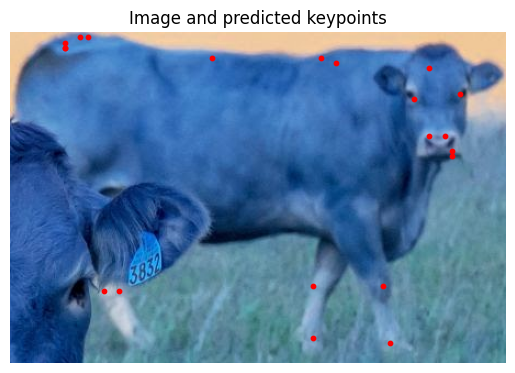

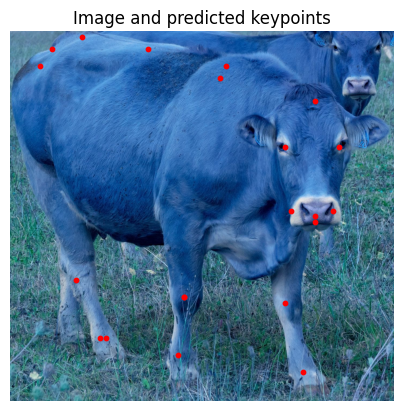

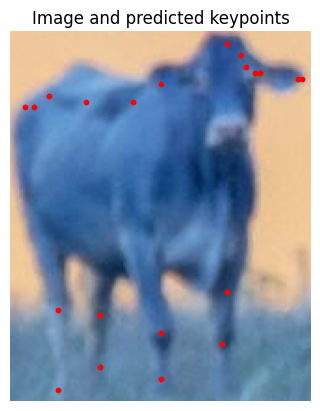

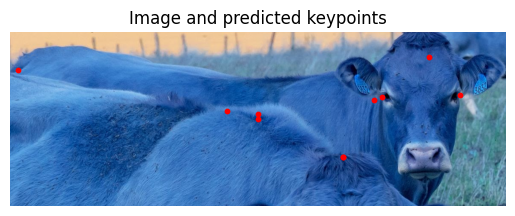

In [273]:
pose_det.fit_pose(image_path, thresh=0.2)

In [239]:
# image dir path
def load_random_image():
    import random
    images_path = os.path.join(module_dir, 'aja_pose', 'dataDir')
    # choose a random image
    image = random.choice(os.listdir(images_path))
    image_path = os.path.join(images_path, image)
    # if file does not endwith .mp4 skip
    if image_path.endswith('.mp4'):
        load_random_image()
    return image_path

image_path = load_random_image()  
    


0: 640x640 4 cows, 144.9ms
Speed: 0.0ms preprocess, 144.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


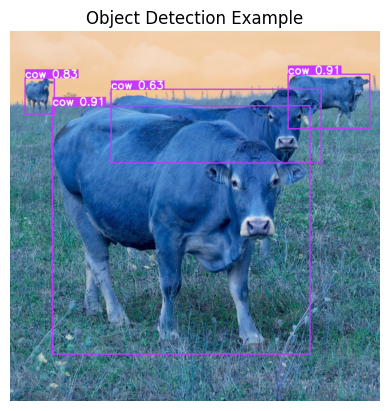

In [248]:
results = obj_det.image_detection(image_path)
plt.imshow(results[0].plot())
plt.axis('off')
# Add title
title="Object Detection Example"
plt.title(title)
# Show the plot
plt.show()

In [265]:
pose_det.fit_pose(image_path, thresh=0.5)

AttributeError: 'VHRBirdPose' object has no attribute 'predict'

In [252]:
results[0].boxes[0]

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([19.])
conf: tensor([0.9109])
data: tensor([[1.5392e+03, 2.3969e+02, 1.9911e+03, 5.4143e+02, 9.1088e-01, 1.9000e+01]])
id: None
is_track: False
orig_shape: (2048, 2048)
shape: torch.Size([1, 6])
xywh: tensor([[1765.1982,  390.5607,  451.8965,  301.7429]])
xywhn: tensor([[0.8619, 0.1907, 0.2207, 0.1473]])
xyxy: tensor([[1539.2500,  239.6893, 1991.1465,  541.4322]])
xyxyn: tensor([[0.7516, 0.1170, 0.9722, 0.2644]])

In [260]:
results[0].boxes.xyxy


tensor([[1539.2500,  239.6893, 1991.1465,  541.4322],
        [ 235.0590,  413.6045, 1660.7344, 1788.8336],
        [  83.9203,  260.0012,  245.3075,  459.8208],
        [ 559.3899,  322.9706, 1722.8590,  730.3719]])

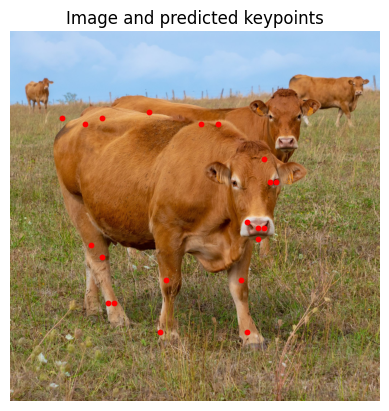

In [241]:
inf.image_pose(image_path, thresh=0.2)


0: 448x640 2 birds, 61.9ms
Speed: 15.6ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


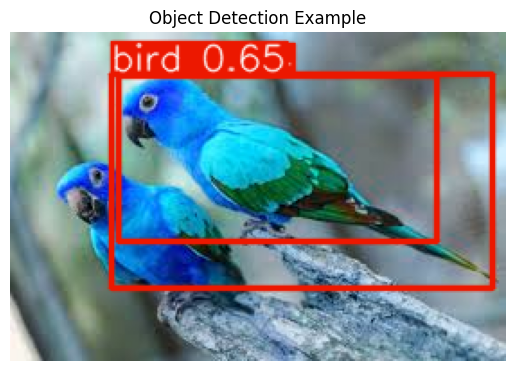

In [195]:
results = obj_det.image_detection(image_path)
plt.imshow(results[0].plot())
plt.axis('off')
# Add title
title="Object Detection Example"
plt.title(title)
# Show the plot
plt.show()

In [246]:
import cv2
result = results[0]
len(result.boxes)
box = result.boxes[0]
print("Object type:", box.cls)
print("Coordinates:", box.xyxy)
print("Probability:", box.conf)

# Load the image
image = cv2.imread(image_path)

# Iterate over each bounding box
for box in result.boxes:
  # Get the coordinates of the bounding box
  x1, y1, x2, y2 = box.xyxy[0].tolist()

  # Crop the image using the bounding box coordinates
  cropped_image = image[int(y1):int(y2), int(x1):int(x2)]

  # Display the cropped image
  cv2.imshow('Cropped Image', cropped_image)
  cv2.waitKey(0)

# Close all windows
cv2.destroyAllWindows()

for box in result.boxes:
  class_id = result.names[box.cls[0].item()]
  cords = box.xyxy[0].tolist()
  cords = [round(x) for x in cords]
  conf = round(box.conf[0].item(), 2)
  print("Object type:", class_id)
  print("Coordinates:", cords)
  print("Probability:", conf)
  print("---")

Object type: tensor([19.])
Coordinates: tensor([[1539.2500,  239.6893, 1991.1465,  541.4322]])
Probability: tensor([0.9109])
Object type: cow
Coordinates: [1539, 240, 1991, 541]
Probability: 0.91
---
Object type: cow
Coordinates: [235, 414, 1661, 1789]
Probability: 0.91
---
Object type: cow
Coordinates: [84, 260, 245, 460]
Probability: 0.83
---
Object type: cow
Coordinates: [559, 323, 1723, 730]
Probability: 0.63
---


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[0.78125]
0.78125
[[[132.27246   71.237305]
  [138.37598   73.67871 ]
  [138.37598   74.899414]
  [143.25879   91.98926 ]
  [139.59668   84.66504 ]
  [138.37598   85.88574 ]
  [142.03809   93.20996 ]
  [111.52051   96.87207 ]
  [112.74121   99.31348 ]
  [ 89.54785  101.75488 ]
  [ 89.54785  100.53418 ]
  [120.06543  164.01074 ]
  [ 89.54785  129.83105 ]
  [124.94824  122.506836]
  [127.38965  135.93457 ]
  [124.94824  134.71387 ]
  [132.27246  153.02441 ]
  [124.94824  153.02441 ]
  [139.59668  173.77637 ]
  [ 81.00293  179.87988 ]
  [113.961914 131.05176 ]
  [105.41699  138.37598 ]
  [120.06543  165.23145 ]]]
132.27246 71.237305
138.37598 73.67871
138.37598 74.899414
143.25879 91.98926
139.59668 84.66504
138.37598 85.88574
142.03809 93.20996
111.52051 96.87207
112.74121 99.31348
89.54785 101.75488
89.54785 100.53418
120.06543 164.01074
89.54785 129.83105
124.94824 122.506836
127.38965 135.93457
124.94824 134.71387
132.27246 153.02441
124.94824 153.02441
139.59668 173.77637
81.00293 17

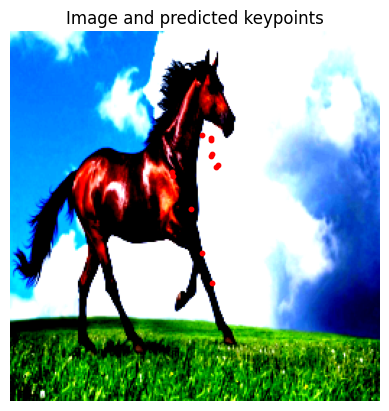

In [69]:
inf.image_pose(image_path, thresh=0.4)

In [63]:
inf.load_image(image_path, transform=False).size

(1926, 1086)

[0.78125]


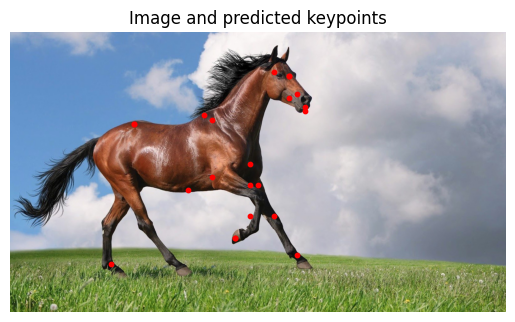

In [74]:
inf.image_pose(image_path, thresh=0.1)

[0.78125]
0.78125


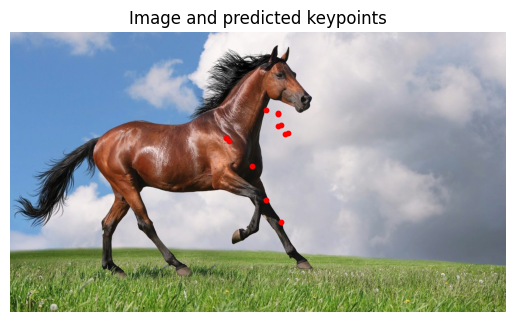

In [51]:
inf.image_pose(image_path, thresh=0.4)

0x0-horses-the-wings-of-mankind-1527015927739.jpg
[0.78125]


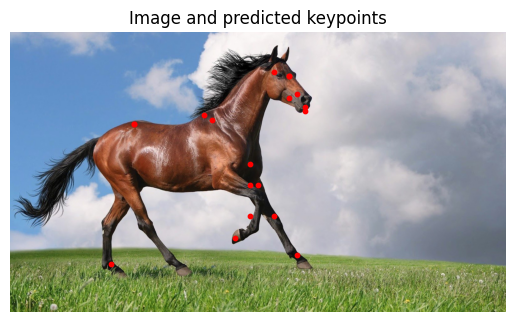

1713778826156.jpg
[0.78125]


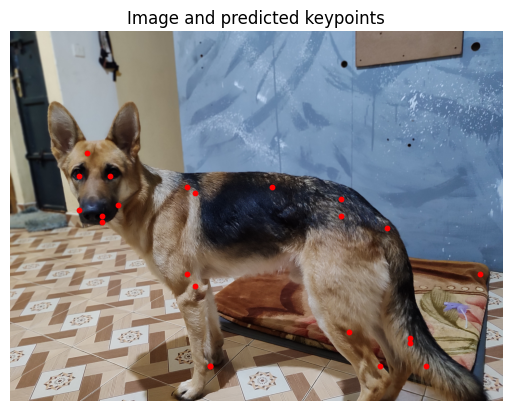

1713779146960.jpg
[0.78125]


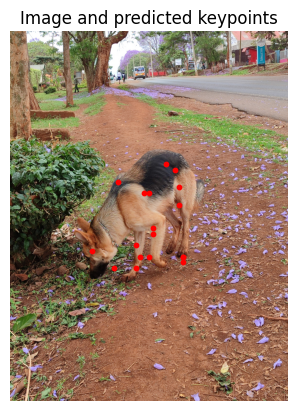

8q90217t58_Humpback_Whale_and_Calf_WW2131047.jpg
[0.78125]


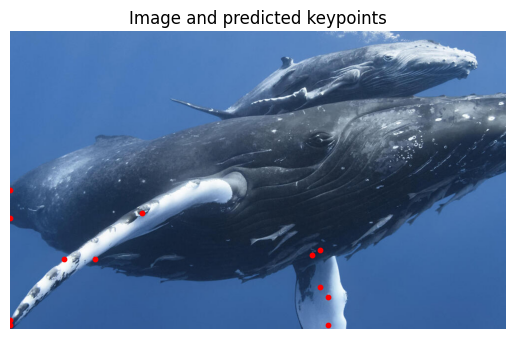

ABJYRLSQ_f000034.jpg
[0.78125]


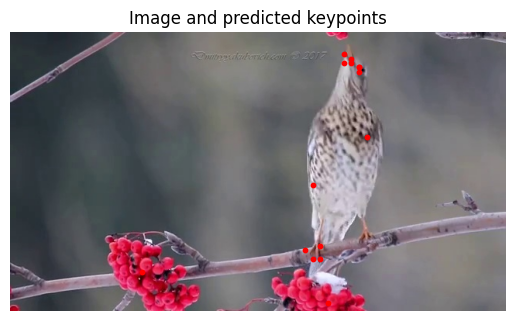

AdobeStock_96520936_541522_reduced.jpg
[0.78125]


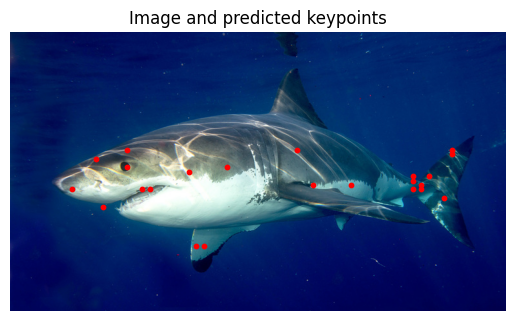

animals_hero_lizards.jpg
[0.78125]


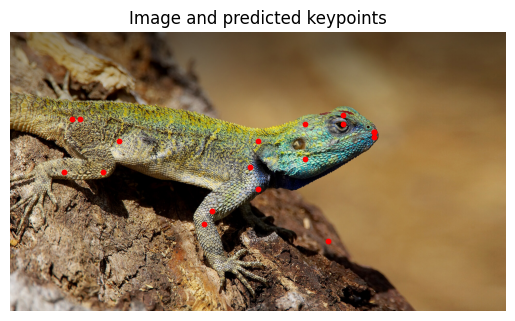

bird.jfif
[0.78125]


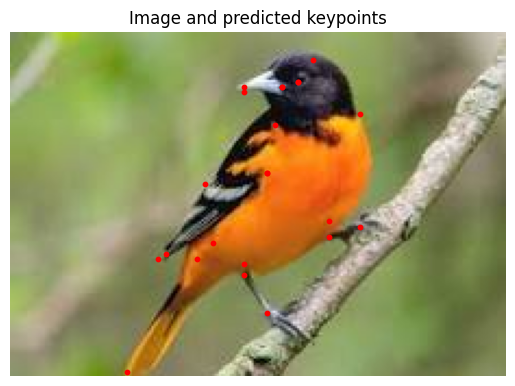

covergushter.jpg
[0.78125]


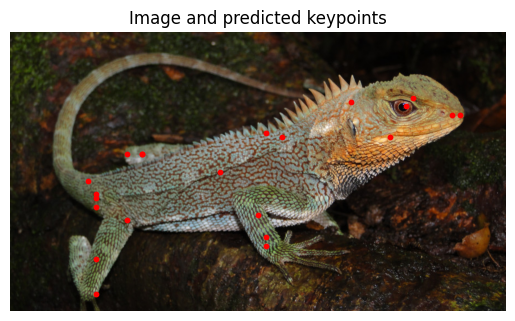

Crocodile-Pic.jpg
[0.78125]


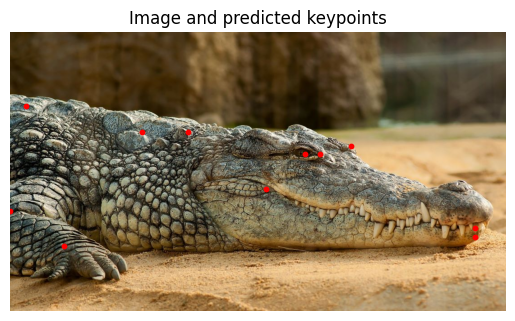

download (1).jfif
[0.78125]


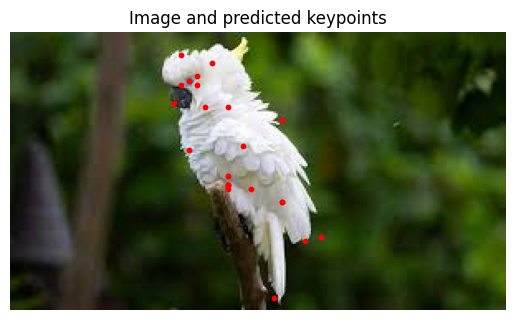

download (2).jfif
[0.78125]


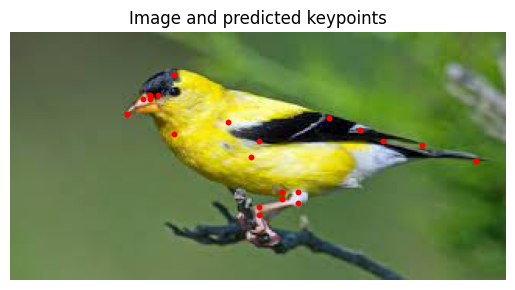

download (3).jfif
[0.78125]


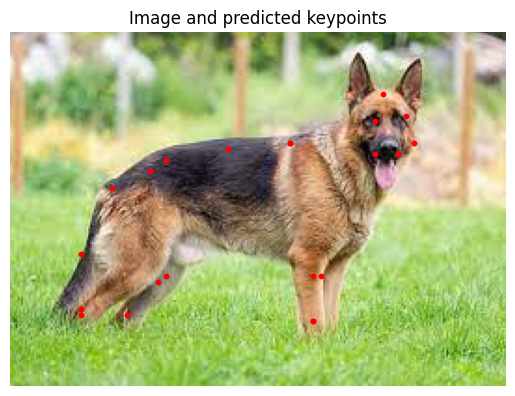

download (4).jfif
[0.78125]


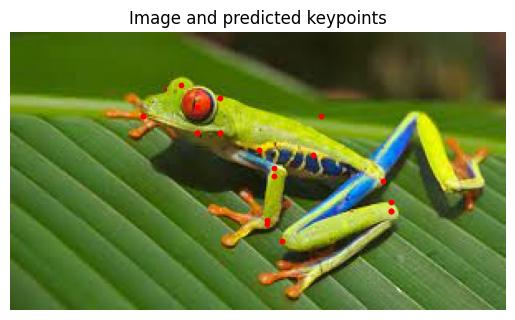

download (5).jfif
[0.78125]


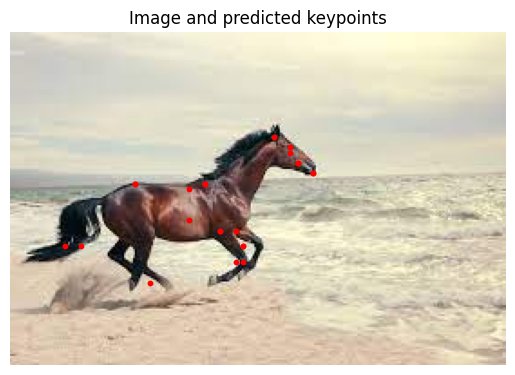

download (6).jfif
[0.78125]


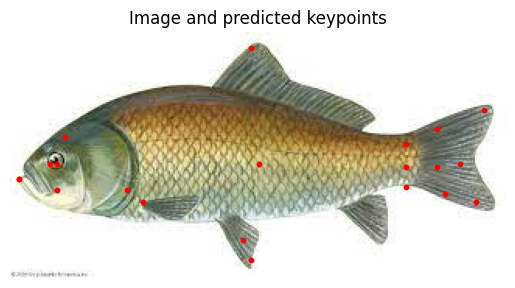

download.jfif
[0.78125]


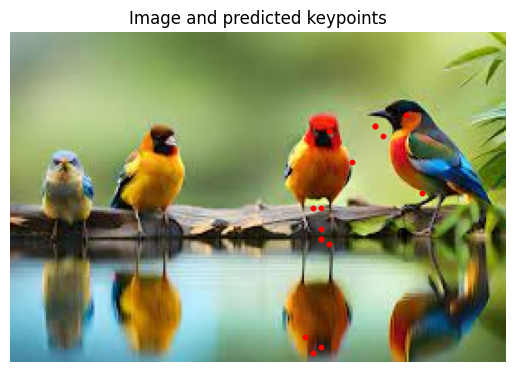

Eastern-Brown-Snake-1200x800.jpg
[0.78125]


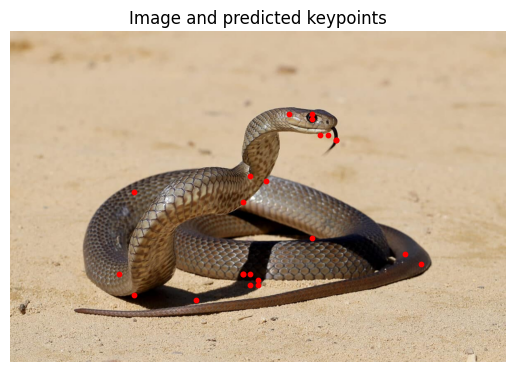

Full_Shot_of_a_Caribbean_Reef_Shark_at_Tiger_Beach_Bahamas.jpg
[0.78125]


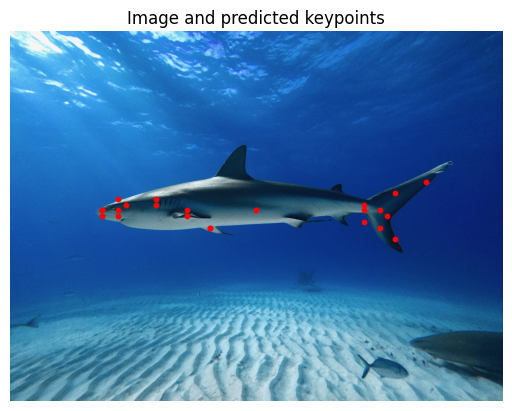

high-angle-view-of-humpback-whale-swimming-in-sea-royalty-free-image-1702574312.jpg
[0.78125]


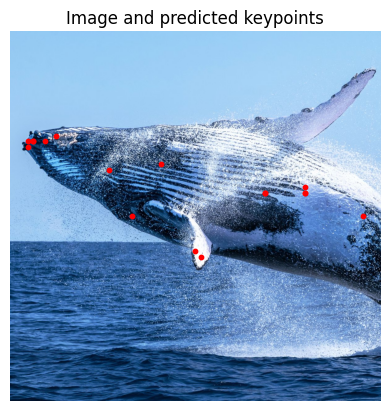

images (1).jfif
[0.78125]


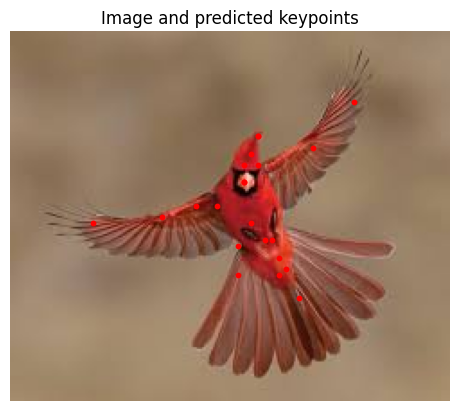

images (2).jfif
[0.78125]


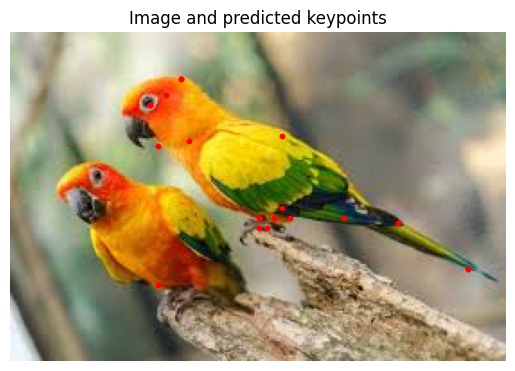

images (3).jfif
[0.78125]


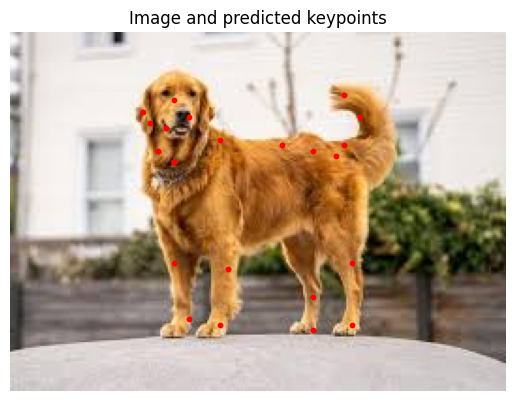

images.jfif
[0.78125]


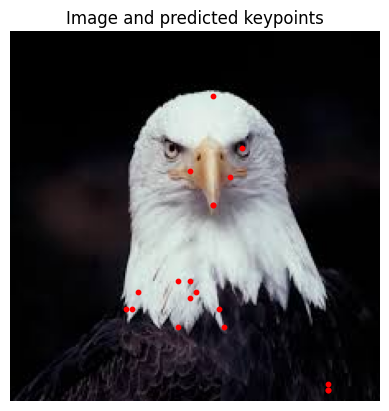

licensed-image.jfif
[0.78125]


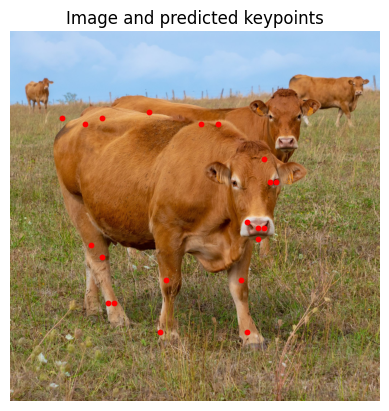

moderncrocodile_rutpratheep_nilpechr_500.jpeg
[0.78125]


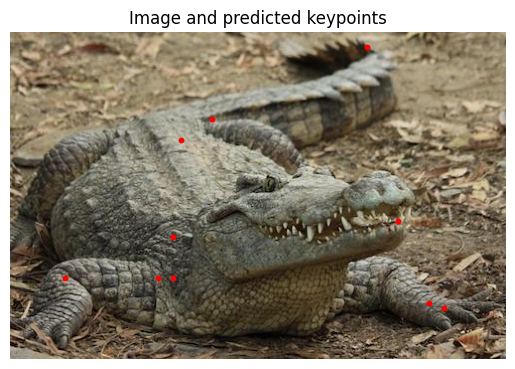

pexels-helena-lopes-1996333.jpg
[0.78125]


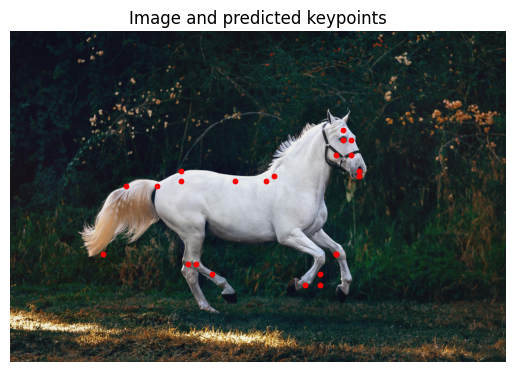

SaltwaterCrocodile('Maximo').jpg
[0.78125]


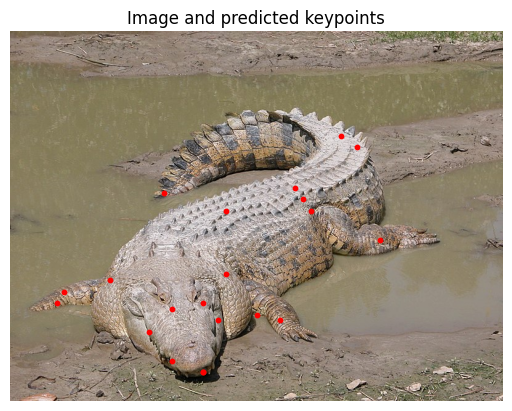

tiger-snake.jpg
[0.78125]


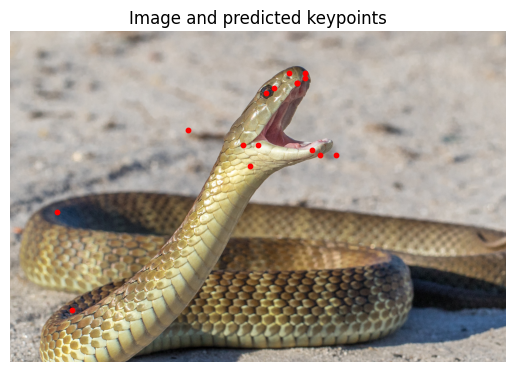

Whale-Jumping.jpg
[0.78125]


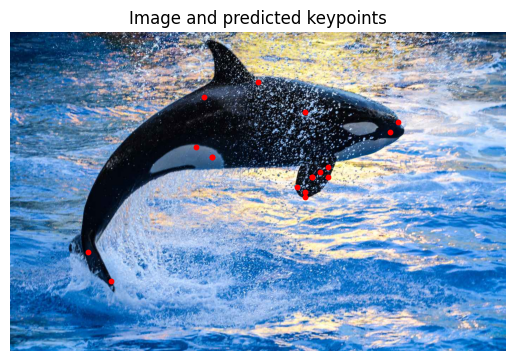

In [78]:
images_path = os.path.join(module_dir, 'aja_pose', 'dataDir')
for i in os.listdir(images_path):
    if i.endswith('.mp4'):
        continue
    print(i)
    image2_path = os.path.join(images_path, i)
    inf.image_pose(image2_path, thresh=0.2)

In [235]:
 # image transformation
image_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# load the model
model = inf.load_model()

# load the image
image = Image.open(image_path)
# get the image size
image_size = image.size
# Transform the image
image = image_transform(image)
# add batch dimension
image_unsq = image.unsqueeze(0)
# get the keypoints from the model
with torch.no_grad():
    output = model(image_unsq) # shape (1,23,64,64) Heatmap

In [236]:
# get the image centre
def get_image_center(image):
    return image.shape[2]/2, image.shape[3]/2

# get the image scale with respect to 200px
def get_image_scale(image):
    return 200/image.shape[2]

center = list(get_image_center(image_unsq))
scale = get_image_scale(image_unsq)

In [237]:
cent = np.array([[center]])
sc = [scale]
coords, maxvals = get_final_preds(
                cfg, output.clone().cpu().numpy(), cent, sc)


0.78125


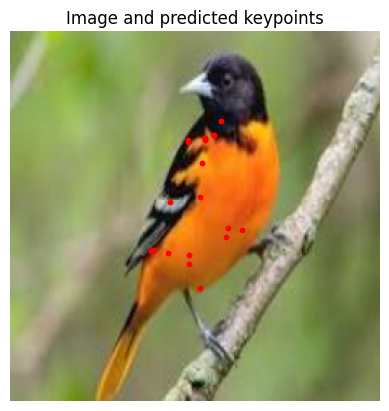

In [240]:
import matplotlib.pyplot as plt
import cv2
img = image.numpy().transpose(1,2,0)
# resize to the original image size
# img = cv2.resize(img, image_size)
thresh = 0.5
# remove normalization
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
img = np.clip(img, 0, 1)
plt.imshow(img)
plt.title('Image and predicted keypoints')
plt.axis('off')

# Plot the keypoints
for i in range(len(coords[0])):  # Iterate through each keypoint
    x, y = coords[0][i]
    # x,y = x/256*image_size[0], y/256*image_size[1]
    if maxvals[0][i] < thresh:
        continue

    plt.scatter(x,y, color='red', s=10)  # Plot the keypoint on the image

plt.show()

In [230]:
img.shape

(1080, 1920, 3)

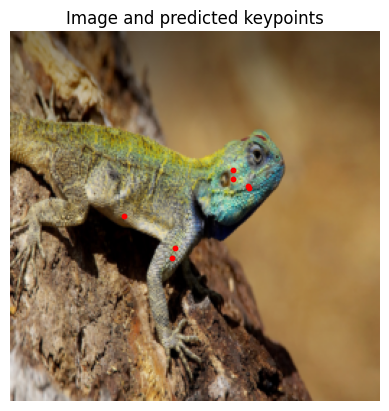

In [226]:
import matplotlib.pyplot as plt
import cv2

# Assuming img, coords, and image_size are already defined
img = image.numpy().transpose(1, 2, 0)
thresh = 0.5

cv2.resize(img, (image_size[1], image_size[0]))

# Remove normalization
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
img = np.clip(img, 0, 1)

# Plot the image
plt.imshow(img)
plt.title('Image and predicted keypoints')
plt.axis('off')

# Plot the keypoints
for i in range(len(coords[0])):  # Iterate through each keypoint
    x, y = coords[0][i]
    if maxvals[0][i] < thresh:
        continue

    plt.scatter(x, y, color='red', s=10)  # Plot the keypoint on the image

plt.show()


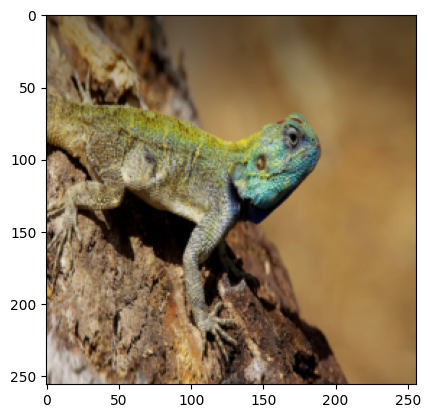

In [217]:
plt.imshow(img)

In [210]:
image_size

(1920, 1080)

In [213]:
img.shape

(256, 256, 3)

In [190]:
gh, jk = [1080, 1920]
gh/2

540.0

In [186]:
# Calculate the scale factor to resize the width to 200 pixels while maintaining the aspect ratio
scale_factor = 200 / image.shape[1]  # Desired width / Original width

# Calculate the new dimensions
new_width = 200
new_height = int(image.shape[0] * scale_factor)  # Maintain the aspect ratio

In [187]:
scale_factor

0.78125

In [157]:
len(coords[0])

23

In [150]:
img = image.numpy().transpose(1,2,0)

for i in range(len(coords[0])):
    x, y = coords[0][i]
    img = cv2.circle(
        img, (x,y), 0.5, (0, 255, 0)
    )

# # resize to the original image size
# img = cv2.resize(img, image_size)

# # remove normalization
# img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
# # img = np.clip(img, 0, 1)

# plt.imshow(img)

error: OpenCV(4.9.0) :-1: error: (-5:Bad argument) in function 'circle'
> Overload resolution failed:
>  - Layout of the output array img is incompatible with cv::Mat
>  - Expected Ptr<cv::UMat> for argument 'img'


In [152]:
# Convert img to uint8 if necessary
img = (img * 255).astype(np.uint8)

for i in range(len(coords[0])):
    x, y = coords[0][i]
    # Ensure x and y are integers
    x, y = int(x), int(y)
    # Draw the circle on the image
    img = cv2.circle(img, (x, y), 1, (0, 255, 0), thickness=1)

# Display the image
plt.imshow(img)


error: OpenCV(4.9.0) :-1: error: (-5:Bad argument) in function 'circle'
> Overload resolution failed:
>  - Layout of the output array img is incompatible with cv::Mat
>  - Expected Ptr<cv::UMat> for argument 'img'


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


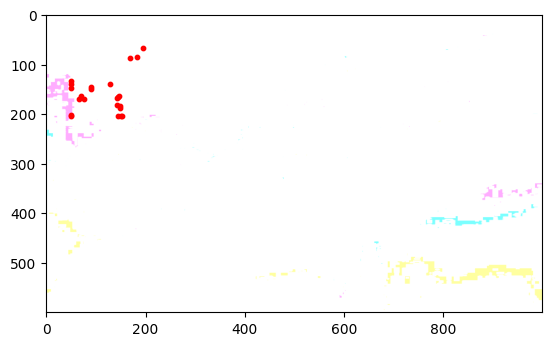

In [154]:
# draw dots at the coords to the image
import matplotlib.pyplot as plt

# Convert img to uint8 if necessary
img = (img * 255).astype(np.uint8)

# # resize to the original image size
img = cv2.resize(img, image_size)

# remove normalization
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
# img = np.clip(img, 0, 1)

# plt.imshow(img)
# Plot the image
plt.imshow(img)

# Draw points on the image
for i in range(len(coords[0])):
    x, y = coords[0][i]
    plt.scatter(x, y, color='red', s=10)  # Draw a red point at (x, y)

# Show the plot
plt.show()





In [116]:
plot_keypoints(image, coords, maxvals, threshold=0.5)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices